In [8]:
from enigma.machine import EnigmaMachine
from itertools import permutations, product
import numpy as np
# setup machine according to specs from a daily key sheet:

machine = EnigmaMachine.from_key_sheet(
       rotors='II IV V',
       reflector='B',
       ring_settings=[1, 20, 11],
       plugboard_settings='AV BS CG DL FU HZ IN KM OW RX')

# set machine initial starting position
machine.set_display('WXC')
c = machine.process_text('WetterberichtDer Angriff auf die westflanke war erfolgreich doch ging mit grossen verlusten einher wir fordern dringend verstaerkung an', None)
print(c)
machine.set_display('WXC')
print(machine.process_text(c))
machine.set_display('WXC')

print('THis is the text ' , machine.process_text('KCH'))
machine.set_display('WXC')
# decrypt the message key
msg_key = machine.process_text('KCH')

# decrypt the cipher text with the unencrypted message key
machine.set_display(msg_key)



IAJOCWPVZHMMCIJDXAXSNJHLAQCPFENZQNUWLZARROAODNMUXJORQTNFXCDIPAUMEDBAIRDCGMSJLCWHKQWFYDBWVXIETOLQCDELINQOADETACSEWKQMIZ
WETTERBERICHTDERANGRIFFAUFDIEWESTFLANKEWARERFOLGREICHDOCHGINGMITGROSSENVERLUSTENEINHERWIRFORDERNDRINGENDVERSTAERKUNGAN
THis is the text  BLA


In [3]:
#Breaking enigma rotor and ring settings without plaintext using Index of Coincidence, Letter frequency and n-grams assuming we know plugboard and start position.



GERMAN_LETTER_FREQ = {
    'A': 6.51, 'B': 1.89, 'C': 2.73, 'D': 5.08, 'E': 17.40, 
    'F': 1.66, 'G': 3.01, 'H': 4.76, 'I': 7.55, 'J': 0.27,
    'K': 1.21, 'L': 3.44, 'M': 2.53, 'N': 9.78, 'O': 2.51,
    'P': 0.79, 'Q': 0.02, 'R': 7.00, 'S': 7.27, 'T': 6.15,
    'U': 4.35, 'V': 0.67, 'W': 1.89, 'X': 0.03, 'Y': 0.04,
    'Z': 1.13
}

# Some example bigrams and trigrams (frequencies here are arbitrary weights for scoring)
BIGRAMS = {'CH': 1.91, 'ER': 1.53, 'EN': 1.51, 'DE': 1.42, 'EI': 1.32}
TRIGRAMS = {'DER': 0.48, 'SCH': 0.34, 'EIN': 0.33, 'ICH': 0.32, 'NDE': 0.31}

def letter_frequency_score(text):
    """
    Calculate a score based on the match between observed and expected
    letter frequencies (lower MSE is better).
    """
    text = text.upper()
    text_freq = {letter: text.count(letter) / len(text) * 100 for letter in GERMAN_LETTER_FREQ}
    mse = np.mean([(text_freq[letter] - GERMAN_LETTER_FREQ[letter]) ** 2 for letter in GERMAN_LETTER_FREQ])
    return 1 / (1 + mse)  # A higher score indicates a closer match

def ngram_score(text, ngrams):
    """
    Calculate a score by summing up the counts (weighted) of known n-grams.
    """
    text = text.upper()
    score = 0
    for ngram, weight in ngrams.items():
        score += text.count(ngram) * weight
    return score

def index_of_coincidence(text):
    """
    Calculate the index of coincidence (IC) and return a score that 
    is higher when IC is close to the typical German value (~0.076).
    """
    text = text.upper()
    N = len(text)
    if N < 2:
        return 0
    freqs = np.array([text.count(letter) for letter in set(text)])
    IC = np.sum(freqs * (freqs - 1)) / (N * (N - 1))
    # We want IC to be near 0.076. The closer it is, the larger 1/abs(IC - 0.076) will be.
    return 1 / (abs(IC - 0.076) + 1e-6)  #although unlikely, added small term to avoid division by zero

def combined_score(text):
    """
    Combine the letter frequency, n-gram and IC measures into a single score.
    The weights here (0.4, 0.4, 0.2) are just an example.
    """
    w1, w2, w3 = 0.4, 0.4, 0.2
    freq_score = letter_frequency_score(text)
    #For n-grams we use a subset (e.g. CH and ER) with example weights.
    bi_score = ngram_score(text, {'CH': 0.02, 'ER': 0.015})
    ic_score = index_of_coincidence(text)
    return w1 * freq_score + w2 * bi_score + w3 * ic_score

# ============================================
# Brute-force search over rotor & ring settings
# ============================================
def brute_force_enigma(cipher_text, plugboard_settings, reflector='B', initial_display='WXC'):
    """
    Try all rotor orders (from a list of available rotors) and all ring settings
    (1 to 26 for each rotor) to find the configuration that yields the most
    German-like decrypted text (according to combined_score).
    
    Parameters:
      - cipher_text: the ciphertext string
      - plugboard_settings: string defining plugboard connections (e.g., 'AV BS CG ...')
      - reflector: reflector type (default 'B')
      - initial_display: the starting position for the rotors (e.g., 'WXC')
    
    Returns:
      A tuple (best_config, best_plaintext, best_score) where best_config is a
      dictionary containing the rotor order and ring settings.
    """
    # Define available rotors (for Enigma 1 it had 5 options, pick 3 for use)
    rotor_names = ['I', 'II', 'III', 'IV', 'V']
    best_score_found = -float('inf')
    best_config = None
    best_plaintext = ""
    
    # Loop over all rotor orders (order matters)
    for rotor_order in permutations(rotor_names, 3):
        print("Testing rotor order:", rotor_order)
        #Loop over all possible ring settings (each rotor can be set from 1 to 26)
        for ring_settings in product(range(1, 27), repeat=3):
            try:
                machine = EnigmaMachine.from_key_sheet(
                    rotors=" ".join(rotor_order),
                    reflector=reflector,
                    ring_settings=list(ring_settings),
                    plugboard_settings=plugboard_settings
                )
                #set the intial starting position
                machine.set_display(initial_display)
                # Decrypt (or encrypt) the ciphertext
                decrypted_text = machine.process_text(cipher_text) 
                #compute a score for the decrypted text.
                score = combined_score(decrypted_text)
                #always keep the highest score
                if score > best_score_found:
                    best_score_found = score
                    best_config = {
                        'rotor_order': rotor_order,
                        'ring_settings': ring_settings,
                        'reflector': reflector,
                        'plugboard_settings': plugboard_settings,
                        'initial_display': initial_display
                    }
                    best_plaintext = decrypted_text
                    print("New best score: {:.4f} with config: {}".format(best_score_found, best_config))
            except Exception as e:
                # If a configuration causes an error, skip it.
                print("Error with config {} {}: {}".format(rotor_order, ring_settings, e))
    
    return best_config, best_plaintext, best_score_found


# Example usage

if __name__ == '__main__':
    # For demonstration, assume this is the ciphertext you want to crack.
    cipher_text = ("IAJOCWPVZHMMCIJDXAXSNJHLAQCPFENZQNUWLZARROAODNMUXJORQTNFXCDIPAUMEDBAIRDCGMSJLCWHKQWFYDBWVXIETOLQCDELINQOADETACSEWKQMIZ")
    
    #as mentioined we assume we know the plugboard setting
    plugboard = 'AV BS CG DL FU HZ IN KM OW RX'
    
    #run the algorithm
    best_config, best_plaintext, best_score = brute_force_enigma(cipher_text, plugboard)
    
    print("\nBest configuration found:")
    print(best_config)
    print("\nDecrypted text (best candidate):")
    print(best_plaintext)
    print("\nScore: {:.4f}".format(best_score))


Testing rotor order: ('I', 'II', 'III')
New best score: 5.1660 with config: {'rotor_order': ('I', 'II', 'III'), 'ring_settings': (1, 1, 1), 'reflector': 'B', 'plugboard_settings': 'AV BS CG DL FU HZ IN KM OW RX', 'initial_display': 'WXC'}
New best score: 5.2396 with config: {'rotor_order': ('I', 'II', 'III'), 'ring_settings': (1, 1, 2), 'reflector': 'B', 'plugboard_settings': 'AV BS CG DL FU HZ IN KM OW RX', 'initial_display': 'WXC'}
New best score: 5.8103 with config: {'rotor_order': ('I', 'II', 'III'), 'ring_settings': (1, 1, 3), 'reflector': 'B', 'plugboard_settings': 'AV BS CG DL FU HZ IN KM OW RX', 'initial_display': 'WXC'}
New best score: 6.5169 with config: {'rotor_order': ('I', 'II', 'III'), 'ring_settings': (1, 1, 21), 'reflector': 'B', 'plugboard_settings': 'AV BS CG DL FU HZ IN KM OW RX', 'initial_display': 'WXC'}
Error with config ('I', 'II', 'III') (1, 1, 26): invalid ring_setting
Error with config ('I', 'II', 'III') (1, 2, 26): invalid ring_setting
Error with config ('I',

Ciphertext:
 XDQWOZXYKVUGADJQONKEFIFNWDVVPSEICLYZRSPBFTUNVJFYWZNNRESLMUDKIUUCFRYMMXIPLZKNAIKLARWBXUNDCZLKKHEPIQJKMCFUKYACKAOVTIYFEQTEMBEDXBJCRBSGGPPVISAFHJKWGFPBFVVTZSQZGAHISSQAVYJCUVMXCXSFAGMEADBPGWLVWTFGMXQAPBCSNOTASYPHNHESFCOIGFFCPGSGTYOAUUUXBWSBHSUVULEXVVCZSWOGZWKZRPCQYEXQOXAYYTKISMAYJTGQBQTIHBCOURCZETUGCXGHODSXTDNQCYSHAJXIILWKSLMKLJTSZICZFKOVZPLHDRFCYUOTFDEVSXGYQQTNANZDVWDAUNTNQFZPTJBJPIGAQZWAJEMWDCZJXAYOZAKCIXABHEMDHQXJZATXXXFLWZPEYQIHUIDGNSSIWHNEYRGOVKIFTWAZAHDCJONDOLXAJGQBSEAAYDBPPFFMYXWPZISDOQWWIWFRJFYZDPZNYETSEPMMWZCNFBFZWUFZOEZTRIGDGWSROQFEGOSMDCUTIVWAHMFJADHIWWWPPZXUKFYXFDKPXHQTGHNNEDSZJSHHDNSQELJXJBGWCLOEVEIYIBEJOWDQIAFJCSMJADREYISWBUADODAVVPHRAKITQKASKHEEDQQGWOVFLBFGCQPZHYRBMDJMDJIQLHANCJGWYVJXQQXOAYKHVBRAXOAANOBIGUOXHUVCRXWVXVNDWCLHZJRJAAZZUCENUPOICVPKVYDDFKINMUJZVALTYKYITLGARGTVMQOWAUCSSNISQBKDDZQDPTXXLPMMMYSTJSVBCJODHYKGJSPPNOOMULVFIYTAHMFSIWLLQLAMLUWAHGZVAVSZNWFJXCBGRQTVBDYZNRLVUNVFJXTKRGYQYBECPWJAAPBMIMCEBBZCBQIRRABAQWYUZQVAPQROUTSUWOVFPFEDGMQZBOYQTOBWMRXFIFSJJBZVFWO

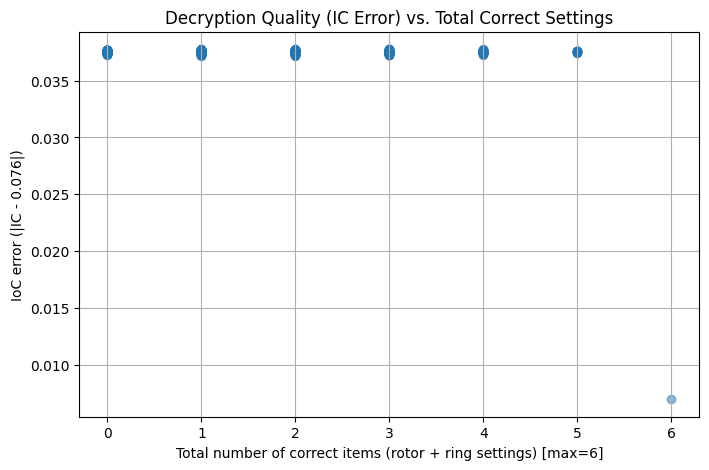

In [6]:
from enigma.machine import EnigmaMachine
from itertools import permutations, product
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def ic_error(text, expected=0.076):
    """
    Compute the index of coincidence (IC) for the given text,
    and return the absolute error |IC - expected|.
    (A lower error means the text's IC is closer to the expected value.)
    """
    # Remove non-alphabetic characters and convert to uppercase.
    text = ''.join(filter(str.isalpha, text.upper()))
    N = len(text)
    if N <= 1:
        return None
    # Compute frequencies for each unique letter.
    freqs = np.array([text.count(letter) for letter in set(text)])
    IC = np.sum(freqs * (freqs - 1)) / (N * (N - 1))
    return abs(IC - expected)

# === True Enigma settings (from the daily key sheet) ===

# True rotor order and ring settings.
correct_rotors = ['II', 'IV', 'V']
correct_ring_settings = [1, 20, 11]

# The plugboard, reflector, and starting display are assumed to be known.
plugboard_settings = 'AV BS CG DL FU HZ IN KM OW RX'
reflector = 'B'
starting_display = 'WXC'

# === Prepare plaintext and create ciphertext ===

german_text_2 = ("WIRSPRECHENJETZTEINMALAUFDEMGANZENPFADAUFKANNSTNICHTMACHENTOLLVIELSEHRWUNDERBARABERGENERELLISTALLESGLEICHGANZEGALWIEMANESNIMMTDENNEESISTIMENDEFFEKTEGAL")
german_text = ("EsisteinparadiesmatischesLandin dem einem gebratene Satzteile in den Mund fliegen Nicht einmal von der allmaechtigen Interpunktion werden die Blindtexte beherrscht – ein geradezu unorthographisches Leben Eines Tages aber beschloß eine kleine Zeile Blindtext ihr Name war Lorem Ipsum hinaus zu gehen in die weite Grammatik Der große Oxmox riet ihr davon ab da es dort wimmele von boesen Kommata wilden Fragezeichen und hinterhaeltigen Semikoli doch das Blindtextchen ließ sich nicht beirren Es packte seine sieben Versalien schob sich sein Initial in den Guertel und machte sich auf den Weg Als es die ersten Huegel des Kursivgebirges erklommen hatte warf es einen letzten Blick zurueck auf die Skyline seiner Heimatstadt Buchstabhausen die Headline von Alphabetdorf und die Subline seiner eigenen Straße der Zeilengasse Wehmuetig lief ihm eine rethorische Frage ueber die Wange dann setzte es seinen Weg fort Unterwegs traf es eine Copy Die Copy warnte das Blindtextchen da wo sie herkaeme waere sie zigmal umgeschrieben worden und alles was von ihrem Ursprung noch uebrig waere sei das Wort „und“ und das Blindtextchen solle umkehren und wieder in sein eigenes sicheres Land zurueckkehren Doch alles Gutzureden konnte es nicht ueberzeugen und so dauerte es nicht lange bis ihm ein paar heimtueckische Werbetexter auflauerten es mit Longe und Parole betrunken machten und es dann in ihre Agentur schleppten wo sie es fuer ihre Projekte wieder und wieder mißbrauchten Und wenn es nicht umgeschrieben wurde dann benutzen Sie es immernoch Weit hinten hinter den Wortbergen fern der Laender Vokalien und Konsonantien leben die Blindtexte Abgeschieden wohnen Sie in Buchstabhausen an der Kueste des Semantik eines großen Sprachozeans Ein kleines Baechlein namens Duden fließt durch ihren Ort und versorgt sie mit den noetigen Regelialien Es ist ein paradiesmatisches Land in dem einem gebratene Satzteile in den Mund fliegen Nicht einmal von der allmaechtigen Interpunktion werden die Blindtexte beherrscht – ein geradezu unorthographisches Leben Eines Tages aber beschloß eine kleine Zeile Blindtext ihr Name war Lorem Ipsum hinaus zu gehen in die weite Grammatik Der große Oxmox riet ihr davon ab da es dort wimmele von boesen Kommata wilden Fragezeichen und hinterhaeltigen Semikoli doch das Blindtextchen ließ sich nicht beirren Es packte seine sieben Versalien schob sich sein Initial in den Guertel und machte sich auf den Weg Als es die ersten Huegel des Kursivgebirges erklommen hatte warf es einen letzten Blick zurueck auf die Skyline seiner Heimatstadt Buchstabhausen die Headline von Alphabetdorf und die Subline seiner eigenen Straße der Zeilengasse Wehmuetig lief")

machine = EnigmaMachine.from_key_sheet(
    rotors=' '.join(correct_rotors),
    reflector=reflector,
    ring_settings=correct_ring_settings,
    plugboard_settings=plugboard_settings
)
machine.set_display(starting_display)
ciphertext = machine.process_text(german_text)
print("Ciphertext:\n", ciphertext, "\n")


available_rotors = ['I', 'II', 'III', 'IV', 'V']

# For each rotor's ring setting, allow only the correct value or one off.
# (For example, if the correct ring setting is 1, we consider [1, 2].)
possible_ring_options = []
for ring in correct_ring_settings:
    lower = max(1, ring - 1)
    upper = min(26, ring + 1)
    possible_ring_options.append(list(range(lower, upper + 1)))

#test a candidate config

results = []  # Each element: (candidate_rotors, candidate_ring, rotor_correct, ring_correct, total_correct, ic_error, decrypted_text)

# Iterate over all candidate rotor orders.
for candidate_rotors in permutations(available_rotors, 3):
    candidate_rotors = list(candidate_rotors)
    # Count rotor positions that match the true rotor order.
    rotor_correct = sum(cand == corr for cand, corr in zip(candidate_rotors, correct_rotors))
    
    # Iterate over candidate ring settings.
    for candidate_ring in product(*possible_ring_options):
        candidate_ring = list(candidate_ring)
        # Count ring settings that exactly match.
        ring_correct = sum(cr == cand for cr, cand in zip(correct_ring_settings, candidate_ring))
        total_correct = rotor_correct + ring_correct  # Maximum possible is 6.

        candidate_machine = EnigmaMachine.from_key_sheet(
            rotors=' '.join(candidate_rotors),
            reflector=reflector,
            ring_settings=candidate_ring,
            plugboard_settings=plugboard_settings
        )
        candidate_machine.set_display(starting_display)

        decrypted_text = candidate_machine.process_text(ciphertext)
        error = ic_error(decrypted_text)

        results.append((candidate_rotors, candidate_ring, rotor_correct, ring_correct, total_correct, error, decrypted_text))


grouped_errors = defaultdict(list)
for _, _, _, _, total_correct, error, _ in results:
    grouped_errors[total_correct].append(error)

print("Average IoC error (|IC - 0.076|) by total number of correct items (rotors + ring settings):")
for total in sorted(grouped_errors.keys()):
    avg_error = np.mean(grouped_errors[total])
    sample_count = len(grouped_errors[total])
    print(f"  {total} correct out of 6: average IoC error = {avg_error:.4f} (from {sample_count} sample(s))")

# === Visualization ===

# Scatter plot: x-axis = total correct items, y-axis = IoC error.
x_vals = [total for (_, _, _, _, total, error, _) in results]
y_vals = [error for (_, _, _, _, total, error, _) in results]

plt.figure(figsize=(8, 5))
plt.scatter(x_vals, y_vals, alpha=0.5)
plt.xlabel("Total number of correct items (rotor + ring settings) [max=6]")
plt.ylabel("IoC error (|IC - 0.076|)")
plt.title("Decryption Quality (IC Error) vs. Total Correct Settings")
plt.grid(True)
plt.show()


INFO: ALL THE FOLLOWING CELLS WERE JUST SOME TESTING AND PLAYING AROUND WITH THE ENIGMA PYHTON LIBRARY, WE DECIDED TO LEAVE THEM IN, BUT THEY ARE NOT MENTIONED IN THE REPORT, NOR GUARANTEE THAT THE CODE IS WORKING FROM HERE ON OUT  ;P

In [9]:



# Define expected German letter frequencies
GERMAN_LETTER_FREQ = {
    'A': 6.51, 'B': 1.89, 'C': 2.73, 'D': 5.08, 'E': 17.40, 
    'F': 1.66, 'G': 3.01, 'H': 4.76, 'I': 7.55, 'J': 0.27,
    'K': 1.21, 'L': 3.44, 'M': 2.53, 'N': 9.78, 'O': 2.51,
    'P': 0.79, 'Q': 0.02, 'R': 7.00, 'S': 7.27, 'T': 6.15,
    'U': 4.35, 'V': 0.67, 'W': 1.89, 'X': 0.03, 'Y': 0.04,
    'Z': 1.13
}
BIGRAMS = {'CH': 1.91, 'ER': 1.53, 'EN': 1.51, 'DE': 1.42, 'EI': 1.32}
TRIGRAMS = {'DER': 0.48, 'SCH': 0.34, 'EIN': 0.33, 'ICH': 0.32, 'NDE': 0.31}
def letter_frequency_score(text):
    """Calculate the letter frequency score."""
    # Count letters in the text
    text_freq = {letter: text.count(letter) / len(text) * 100 for letter in GERMAN_LETTER_FREQ}
    
    # Compute the mean squared error between observed and expected frequencies
    mse = np.mean([(text_freq[letter] - GERMAN_LETTER_FREQ[letter])**2 for letter in GERMAN_LETTER_FREQ])
    return 1 / (1 + mse)  # Higher score for lower MSE

def ngram_score(text, ngrams):
    """Calculate the n-gram score for bigrams/trigrams."""
    score = 0
    for ngram, freq in ngrams.items():
        score += text.count(ngram) * freq
    return score

def index_of_coincidence(text):
    """Calculate the index of coincidence."""
    N = len(text)
    freqs = np.array([text.count(letter) for letter in set(text)])
    IC = np.sum(freqs * (freqs - 1)) / (N * (N - 1))
    return 1 / abs(IC - 0.076)  # Higher score for closer IC

def combined_score(text):
    """Combine all statistical measures into a single score."""
    w1, w2, w3 = 0.4, 0.4, 0.2  # Example weights
    freq_score = letter_frequency_score(text)
    bigram_score = ngram_score(text, {'CH': 0.02, 'ER': 0.015})  # Add real data
    IC_score = index_of_coincidence(text)
    
    return w1 * freq_score + w2 * bigram_score + w3 * IC_score


def cracking_enigma(cyphertext):
    """
    Cracking the Enigma machine ciphertext by exploring rotor and ring configurations.
    For now, we assume a fixed Umkehrwalze (reflector), plugboard, and initial rotor positions.
    """

    # Step 1: Define constants and setup
    # Fixed settings
    reflector = 'B'  # Umkehrwalze B (Reflector B)
    plugboard_settings = ''

      # Plugboard pairs
    starting_position = 'WXC'  # Fixed starting positions for the rotors
    available_rotors = [ 'II', 'IV', 'V']  # 5 available rotors
    
    # Log the fixed settings for debugging purposes
    print("Step 1: Fixed Settings")
    print(f"Reflector: {reflector}")
    print(f"Plugboard Settings: {plugboard_settings}")
    print(f"Starting Position: {starting_position}")
       
    # Step 2: Generate possible rotor and ring configurations
    print("\nStep 2: Generating Rotor and Ring Configurations")

    # Generate all permutations of 3 rotors from the available set
    rotor_combinations = permutations(available_rotors, 3)

    
    
    best_score = 0.0
    # Iterate through all rotor combinations
    for rotor_combination in rotor_combinations:
        print(f"Testing rotor combination: {rotor_combination}")
        # Generate all possible ring settings for each rotor (26 positions per rotor)
    
        ring_settings = product(range(1, 27), repeat=3)  # 1-based indexing for rings
        # Iterate through all possible ring settings
        for ring_setting in ring_settings:
            print(f"  Testing ring settings: {ring_setting}")

            # Create an Enigma machine with the current configuration
            machine = EnigmaMachine.from_key_sheet(
                rotors=' '.join(rotor_combination),
                reflector=reflector,
                ring_settings=' '.join(map(str, ring_setting)),
                plugboard_settings=plugboard_settings
            )

            # Set the initial rotor positions
            machine.set_display(starting_position)
            decrypted_text = machine.process_text(cyphertext)
            if any(c == d for c, d in zip(cyphertext, decrypted_text)):
                # Skip this configuration if any letter decrypts to itself
                continue
            # Calculate statistical score for the decrypted text
            score = combined_score(decrypted_text)
            
            # Keep track of the best-scoring decryption
            if score > best_score:
                best_score = score
                best_decryption = decrypted_text
                best_config = (rotor_combination, ring_setting)
            
    # Return the best decryption and its configuration
    return {
        "best_decryption": best_decryption,
        "best_score": best_score,
        "best_configuration": best_config
    }

# Example of how the function might eventually be called
cyphertext = 'IAJOCWPVZHMMCIJDXAXSNJHLAQCPFENZQNUWLZARROAODNMUXJORQTNFXCDIPAUMEDBAIRDCGMSJLCWHKQWFYDBWVXIETOLQCDELINQOADETACSEWKQMIZ'  # Example ciphertext
result = cracking_enigma(cyphertext)
print(result)


Step 1: Fixed Settings
Reflector: B
Plugboard Settings: 
Starting Position: WXC

Step 2: Generating Rotor and Ring Configurations
Testing rotor combination: ('II', 'IV', 'V')
  Testing ring settings: (1, 1, 1)
  Testing ring settings: (1, 1, 2)
  Testing ring settings: (1, 1, 3)
  Testing ring settings: (1, 1, 4)
  Testing ring settings: (1, 1, 5)
  Testing ring settings: (1, 1, 6)
  Testing ring settings: (1, 1, 7)
  Testing ring settings: (1, 1, 8)
  Testing ring settings: (1, 1, 9)
  Testing ring settings: (1, 1, 10)
  Testing ring settings: (1, 1, 11)
  Testing ring settings: (1, 1, 12)
  Testing ring settings: (1, 1, 13)
  Testing ring settings: (1, 1, 14)
  Testing ring settings: (1, 1, 15)
  Testing ring settings: (1, 1, 16)
  Testing ring settings: (1, 1, 17)
  Testing ring settings: (1, 1, 18)
  Testing ring settings: (1, 1, 19)
  Testing ring settings: (1, 1, 20)
  Testing ring settings: (1, 1, 21)
  Testing ring settings: (1, 1, 22)
  Testing ring settings: (1, 1, 23)
  Test

HERE WE TRY TO CRACK ENIGMA USING A PLAIN TEXT ATTACK> AT FIRST THE PLUGBOARD IS IGNORED AND WE TRY TO FIND THE ROTOR AND RING SETTINGS THAT PRODUCE THE CLOSEST RESEMBLANCE AFTER DECRYPTION OF THE FIRST 13 CHARACTERS TO THE WORD WETTERBERICHT. AFTERWARDS THE IDEA IS TO DEDUCE THE PLUGBOARD SETTINGS.

Ciphertext:
 IAJOCWPVZHMMCIJDXAXSNJHLAQCPFENZQNUWLZARROAODNMUXJORQTNFXCDIPAUMEDBAIRDCGMSJLCWHKQWFYDBWVXIETOLQCDELINQOADETACSEWKQMIZ 

Average combined score by number of correct rotors:
  0 correct rotor(s): average score = 5.5267 (from 32 samples)
  1 correct rotor(s): average score = 5.4464 (from 21 samples)
  2 correct rotor(s): average score = 5.1701 (from 6 samples)
  3 correct rotor(s): average score = 40.0330 (from 1 samples)


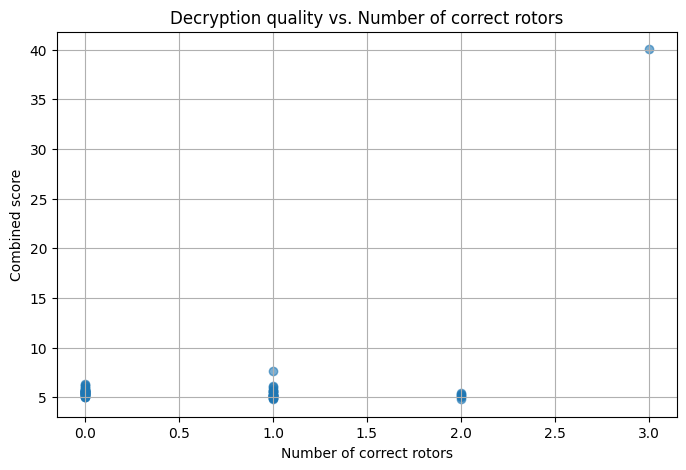

In [14]:
from difflib import SequenceMatcher

def similarity_score(decrypted_text, expected_plaintext):
    """Calculate a similarity score based on character matches."""
    # Normalize lengths by truncating the decrypted text to match the expected plaintext length
    truncated_text = decrypted_text[:len(expected_plaintext)]
    return SequenceMatcher(None, truncated_text, expected_plaintext).ratio()

def cracking_enigma_with_closest_match(cyphertext, expected_plaintext):
    """
    Crack the Enigma machine ciphertext using a known plaintext similarity approach.
    Assumes the plaintext starts with a known phrase (crib).
    """
    from itertools import permutations, product
    from enigma.machine import EnigmaMachine

    # Fixed settings
    reflector = 'B'  # Umkehrwalze B (Reflector B)
    plugboard_settings = ''  # Start with no plugboard connections
    starting_position = 'WXC'  # Fixed starting positions for the rotors
    available_rotors = ['II', 'IV', 'V']  # Available rotors

    # Log the fixed settings for debugging purposes
    print("Step 1: Fixed Settings")
    print(f"Reflector: {reflector}")
    print(f"Plugboard Settings: {plugboard_settings}")
    print(f"Starting Position: {starting_position}")

    # Step 2: Generate possible rotor and ring configurations
    print("\nStep 2: Generating Rotor and Ring Configurations")
    rotor_combinations = permutations(available_rotors, 3)
    
    best_score = 0.0
    best_decryption = None
    best_config = None

    # Iterate through all rotor combinations
    for rotor_combination in rotor_combinations:
        print(f"Testing rotor combination: {rotor_combination}")
        # Generate all possible ring settings for each rotor (26 positions per rotor)
        ring_settings = product(range(1, 27), repeat=3)

        for ring_setting in ring_settings:
            print(f"  Testing ring settings: {ring_setting}")

            # Create an Enigma machine with the current configuration
            machine = EnigmaMachine.from_key_sheet(
                rotors=' '.join(rotor_combination),
                reflector=reflector,
                ring_settings=' '.join(map(str, ring_setting)),
                plugboard_settings=plugboard_settings
            )

            # Set the initial rotor positions
            machine.set_display(starting_position)

            # Decrypt the first part of the ciphertext to compare with the expected plaintext
            partial_decrypted_text = machine.process_text(cyphertext[:len(expected_plaintext)])

            # Calculate similarity to the expected plaintext
            similarity = similarity_score(partial_decrypted_text, expected_plaintext)

            # If this configuration is the best so far, save it
            if similarity > best_score:
                best_score = similarity
                best_decryption = machine.process_text(cyphertext)  # Full decryption for best configuration
                best_config = (rotor_combination, ring_setting)

    # Return the best result found
    return {
        "best_decryption": best_decryption,
        "best_score": best_score,
        "best_configuration": best_config,
        "match_type": "Closest match to crib"
    }

# Example call
cyphertext = 'IAJOCWPVZHMMCIJDXAXSNJHLAQCPFENZQNUWLZARROAODNMUXJORQTNFXCDIPAUMEDBAIRDCGMSJLCWHKQWFYDBWVXIETOLQCDELINQOADETACSEWKQMIZ'
expected_plaintext = 'WETTERBERICHT'  # Known plaintext (crib)
result = cracking_enigma_with_closest_match(cyphertext, expected_plaintext)
print(result)


Find the 5 best rotor settings without plugboard 

In [10]:
import numpy as np
from itertools import permutations, product
from enigma.machine import EnigmaMachine

# Define expected German letter frequencies
GERMAN_LETTER_FREQ = {
    'A': 6.51, 'B': 1.89, 'C': 2.73, 'D': 5.08, 'E': 17.40, 
    'F': 1.66, 'G': 3.01, 'H': 4.76, 'I': 7.55, 'J': 0.27,
    'K': 1.21, 'L': 3.44, 'M': 2.53, 'N': 9.78, 'O': 2.51,
    'P': 0.79, 'Q': 0.02, 'R': 7.00, 'S': 7.27, 'T': 6.15,
    'U': 4.35, 'V': 0.67, 'W': 1.89, 'X': 0.03, 'Y': 0.04,
    'Z': 1.13
}

def letter_frequency_score(text):
    """Calculate the letter frequency score."""
    text_freq = {letter: text.count(letter) / len(text) * 100 for letter in GERMAN_LETTER_FREQ}
    mse = np.mean([(text_freq[letter] - GERMAN_LETTER_FREQ[letter])**2 for letter in GERMAN_LETTER_FREQ])
    return 1 / (1 + mse)  # Higher score for lower MSE

def ngram_score(text, ngrams):
    """Calculate the n-gram score for bigrams/trigrams."""
    return sum(text.count(ngram) * freq for ngram, freq in ngrams.items())

def index_of_coincidence(text):
    """Calculate the index of coincidence."""
    N = len(text)
    freqs = np.array([text.count(letter) for letter in set(text)])
    IC = np.sum(freqs * (freqs - 1)) / (N * (N - 1))
    return 1 / abs(IC - 0.076)  # Higher score for closer IC

def combined_score(text):
    """Combine all statistical measures into a single score."""
    w1, w2, w3 = 0.4, 0.4, 0.2  # Example weights
    return (w1 * letter_frequency_score(text) + 
            w2 * ngram_score(text, {'CH': 0.02, 'ER': 0.015}) + 
            w3 * index_of_coincidence(text))

def cracking_enigma(cyphertext):
    """
    Finds the 5 best rotor and ring configurations for decrypting an Enigma-encrypted ciphertext.
    """
    reflector = 'B'  
    plugboard_settings = 'AV BS CG DL FU HZ'
    starting_position = 'WXC'  
    available_rotors = ['II', 'IV', 'V']

    print("Step 1: Fixed Settings")
    print(f"Reflector: {reflector}")
    print(f"Plugboard Settings: {plugboard_settings}")
    print(f"Starting Position: {starting_position}")
    
    rotor_combinations = permutations(available_rotors, 3)
    
    top_decryptions = []  # Store top 5 best decryptions

    # Iterate through all rotor combinations
    for rotor_combination in rotor_combinations:
        print(f"Testing rotor combination: {rotor_combination}")
        
        ring_settings = product(range(1, 27), repeat=3)  # Generate all possible ring settings
        
        for ring_setting in ring_settings:
            print(f"  Testing ring settings: {ring_setting}")

            # Create Enigma machine with the current configuration
            machine = EnigmaMachine.from_key_sheet(
                rotors=' '.join(rotor_combination),
                reflector=reflector,
                ring_settings=' '.join(map(str, ring_setting)),
                plugboard_settings=plugboard_settings
            )

            machine.set_display(starting_position)
            decrypted_text = machine.process_text(cyphertext)
            
            # Skip configurations where any letter decrypts to itself
            if any(c == d for c, d in zip(cyphertext, decrypted_text)):
                continue  

            # Calculate the statistical score for the decrypted text
            score = combined_score(decrypted_text)
            
            # Store first 5 configurations in the list
            if len(top_decryptions) < 10:
                top_decryptions.append({
                    "decryption": decrypted_text,
                    "score": score,
                    "configuration": (rotor_combination, ring_setting)
                })
            else:
                # Sort by score (highest first)
                top_decryptions.sort(key=lambda x: x["score"], reverse=True)
                
                # If the new score is better than the lowest-ranked one, replace it
                if score > top_decryptions[-1]["score"]:
                    top_decryptions[-1] = {
                        "decryption": decrypted_text,
                        "score": score,
                        "configuration": (rotor_combination, ring_setting)
                    }

    # Return the top 5 decryption results
    return sorted(top_decryptions, key=lambda x: x["score"], reverse=True)

# Example Ciphertext
cyphertext = 'IAJOCWPVZHMMCIJDXAXSNJHLAQCPFENZQNUWLZARROAODNMUXJORQTNFXCDIPAUMEDBAIRDCGMSJLCWHKQWFYDBWVXIETOLQCDELINQOADETACSEWKQMIZ'
top_results = cracking_enigma(cyphertext)

# Print the top 5 results
for i, result in enumerate(top_results, 1):
    print(f"\nTop {i}:")
    print(f"Score: {result['score']}")
    print(f"Decryption: {result['decryption']}")
    print(f"Configuration: {result['configuration']}")


Step 1: Fixed Settings
Reflector: B
Plugboard Settings: AV BS CG DL FU HZ
Starting Position: WXC
Testing rotor combination: ('II', 'IV', 'V')
  Testing ring settings: (1, 1, 1)
  Testing ring settings: (1, 1, 2)
  Testing ring settings: (1, 1, 3)
  Testing ring settings: (1, 1, 4)
  Testing ring settings: (1, 1, 5)
  Testing ring settings: (1, 1, 6)
  Testing ring settings: (1, 1, 7)
  Testing ring settings: (1, 1, 8)
  Testing ring settings: (1, 1, 9)
  Testing ring settings: (1, 1, 10)
  Testing ring settings: (1, 1, 11)
  Testing ring settings: (1, 1, 12)
  Testing ring settings: (1, 1, 13)
  Testing ring settings: (1, 1, 14)
  Testing ring settings: (1, 1, 15)
  Testing ring settings: (1, 1, 16)
  Testing ring settings: (1, 1, 17)
  Testing ring settings: (1, 1, 18)
  Testing ring settings: (1, 1, 19)
  Testing ring settings: (1, 1, 20)
  Testing ring settings: (1, 1, 21)
  Testing ring settings: (1, 1, 22)
  Testing ring settings: (1, 1, 23)
  Testing ring settings: (1, 1, 24)
  T